## Demonstration of DEM Derivatives Calculations ##

This notebook demonstrates how to compute some common raster derivatives.

In [1]:
import sys
import os
sys.path.append('..') #path to the script we need (the dem_getter directory)
from dem_getter import dem_getter as dg #to download DEMS
from dem_getter import dem_derivatives as dd #to calculate some derivatives

import matplotlib.pyplot as plt #visualize output

from osgeo import gdal
gdal.UseExceptions() #suppress unecessary warnings from gdal

To demonstrate the derivate functions, we'll download some test data.

In [2]:
#First let's just download a single lidar tile for a quad of interest to experiment with
product = 'DEM_1m'
quad = 'Durango East'
state = 'Colorado'
n_tiles = 1 #Take the first of the tiles
dl_list=dg.get_aws_paths_from_24kQuadName("DEM_1m",quad, state)[:n_tiles]
saved_paths=dg.batch_download(dl_list,os.path.join('..','test_data','test_downloads'))

rasterPath = saved_paths[0] #Lets just look at the first raster
print('Downloaded file to: {}'.format(rasterPath))

Working on: USGS_1M_12_x77y413_CO_Southwest_NRCS_2018_D18.tif
Downloaded file to: c:\Users\sjohnstone\OneDrive - DOI\Documents\DataTools\dem_getter\dem_getter\notebooks\..\test_data\test_downloads\USGS_1M_12_x77y413_CO_Southwest_NRCS_2018_D18.tif


The function compute_derivatives takes a raster, a list of derivates to calculate, and a filepath to save the output to. It will return a list of the saved filepaths.

Currently available derivatives are:
* **Hillshade** - Calculated by GDAL, a representation of the shading of the landscape with light from a specified direction.   
* **Nadir Hillshade** - A hillshade with vertical illumination. Simply a transformation of slope.
* **Aspect** - The orientation of the slope, where slope is calculated with a second-ordered centered difference approximation. Aspect is calculated so that 0,360 is North, 90 is East, 180 is South, and 270 is West.
* **Absolute value** - The absolute value of pixel values.
* **Slope magnitude** - The magnitude of the gradient, measured with a second-order centered difference approximation.
* **Surface roughness** - Calculated by GDAL, the largest difference between a central cell and its 8 neighbors.
* **Topographic Position Index (TPI)** - The difference between the value (e.g., elevation) of a central pixel and an average of values within an annulus centered on that cell.
* **Mean moving window (circular and square windows)** - The mean value within a square or circular window.
* **Less windowed mean (circular and square windows)** - The difference between the value (e.g., elevation) of a central pixel and the mean value in a window centered around that pixel.
* **Gaussian mean moving window** - The weighted mean of values, where weights are assigned based on a gaussian distribution calculated based on radial distance.
* **Less gaussian mean** - The difference between the value (e.g., elevation) of a central pixel and the gaussian-weighted mean calculated based on surrounding cells. This is a high-pass filtering approach useful for highlighting fine texture.
* **Difference of gaussian means** - The difference between two gaussian mean blurs of the input raster, a band-pass filtering approach useful for highlighting edges and other fine texture in the image.
* **Laplacian** (sometimes refered to as curvature) - The sum of the second-derivatives in the x and y directions, calculated with a second-ordered centered difference approximation.
* **Standard deviation moving window** - The standard deviation within a moving window
* **Ricker wavelet** - The result of convolving a Ricker wavelet with the digital elevation model.


In [3]:
#What derivatives will we calculate for this raster?
derivativeNames= ['hillshade','slope','laplacian','TPI','windowed_mean','less_windowed_mean', 'ricker_wavelet','difference_of_gaussian_means']

#Compute the derivatives, and return a list of paths to them
from importlib import reload
reload(dg)
pathList=dg.compute_derivatives(rasterPath,derivativeNames, os.path.join('..','test_data','test_downloads'))

#Lets transform this list of paths into a dictionary that maps a file path to its derivative name
pathDict = {deriv:path for (deriv,path) in zip(derivativeNames,pathList)}

Instead of a list of derivates, the function can take a single derivative name.

In [4]:
#Which derivative will we calculate
derivativeName= 'less_gaussian_mean'

#Calculate that derivative
output_path = dg.compute_derivatives(rasterPath,derivativeName, os.path.join('..','test_data','test_downloads'))

#Add its path to our dictionary
pathDict[derivativeName] = output_path[0]

Let's look at some of the derivatives we calculated.

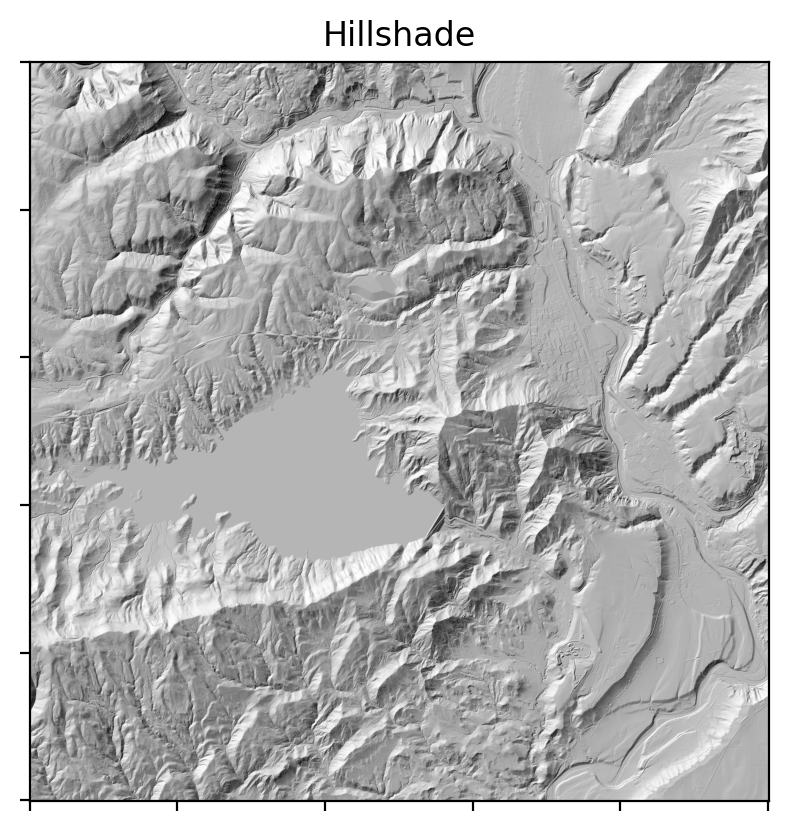

In [5]:
#We can load in and visualize our derivative using gdal...though this won't show the correct
#axis values

#In order to access a previously computed derivative, use gdal.Open() to create a gdal.Dataset object
hill=gdal.Open(pathDict['hillshade'])

#Pull the raster values out of the file
hillArray=hill.GetRasterBand(1).ReadAsArray()

#Close the file access w/ gdal
hill = None

#Create a figure to plot this on
f,axs = plt.subplots(1,1,dpi = 200)
axs.imshow(hillArray,cmap = 'gray')
axs.set_xticklabels([])#tick labels are in pixel coordinates with default imshow, lets hide them
axs.set_yticklabels([])#tick labels are in pixel coordinates with default imshow, lets hide them
plt.title('Hillshade')
plt.show()

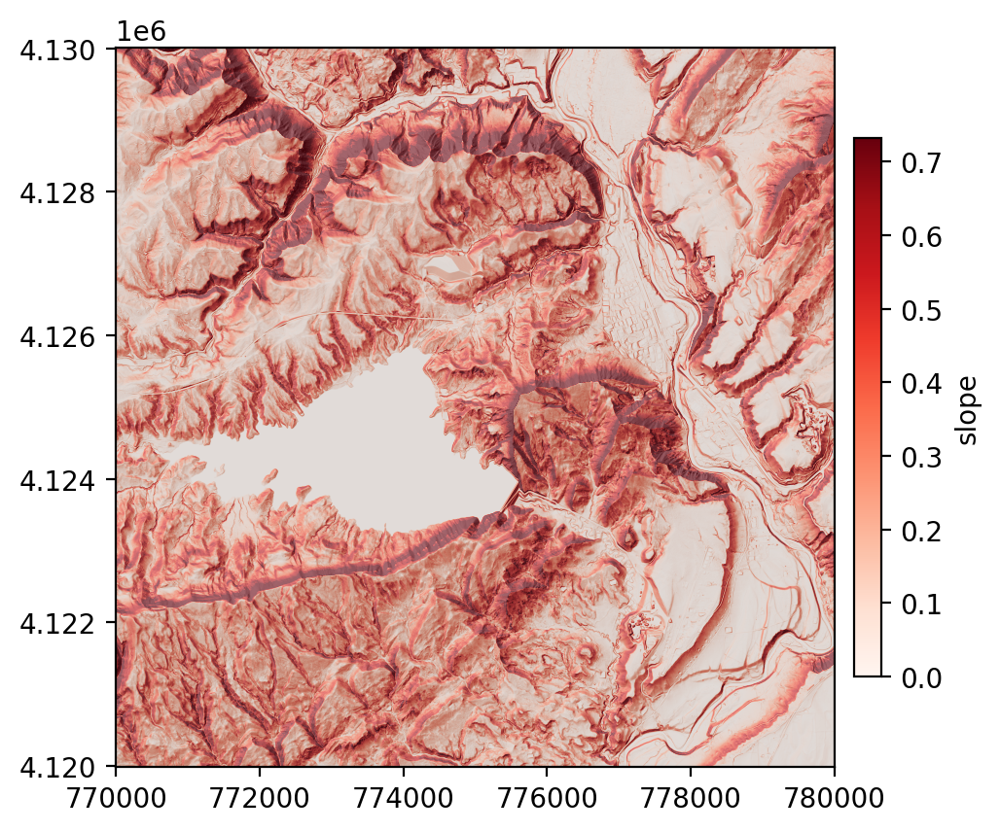

In [6]:
#Alternatively we can use some dem_derivatives functions to help make our plots
derivativeToPlot = 'slope'

#Load in the hillshade to serve as a base
hsSrc = gdal.Open(pathDict['hillshade'])

#Load in a derivative as an overlay
derivSrc = gdal.Open(pathDict[derivativeToPlot])

#First create a figure
f,ax = plt.subplots(1,1,dpi = 200)

#Plot the hillshade first
dd.plot_gdal_source(hsSrc,ax=ax, cmap='gray',vmin = 0, vmax = 255)

#Then plot the derivative, giving it a different colormap,
#a colorbar, scaling its colors to trim extreme values
dd.plot_gdal_source(derivSrc, ax=ax, cmap = 'Reds',
                    alpha = 0.6, #0-1 transparency level
                    doTrimToPercentiles = True, #Trim the displayed colors to a percentile range?
                    valueMinMaxPercentiles = [5,95], #Min, max percentiles to stretch colors between
                    doAddColorbar = True, #Should we add an inset colorbar?

                    #colorbarKwargs is a dictionary of keyword arguments defined by the matplotlib.pyplot.colorbar function
                    #for controlling the appearance of the colorbar. See matplotlib documentation for all options
                    colorbarKwargs = {
                        'location':'right', #Where to draw the colorbar, 'top','left','bottom','right'
                        'fraction':0.1, #Fraction of the original axes to use for the colorbar
                        'pad':0.02, #Fraction of original axes between colorbar and image axes
                        'shrink':0.75, #Fraction by which to multiply the size of the colorbar
                        'label':derivativeToPlot, #Label to give the colorbar
                    }
                    )


plt.show()

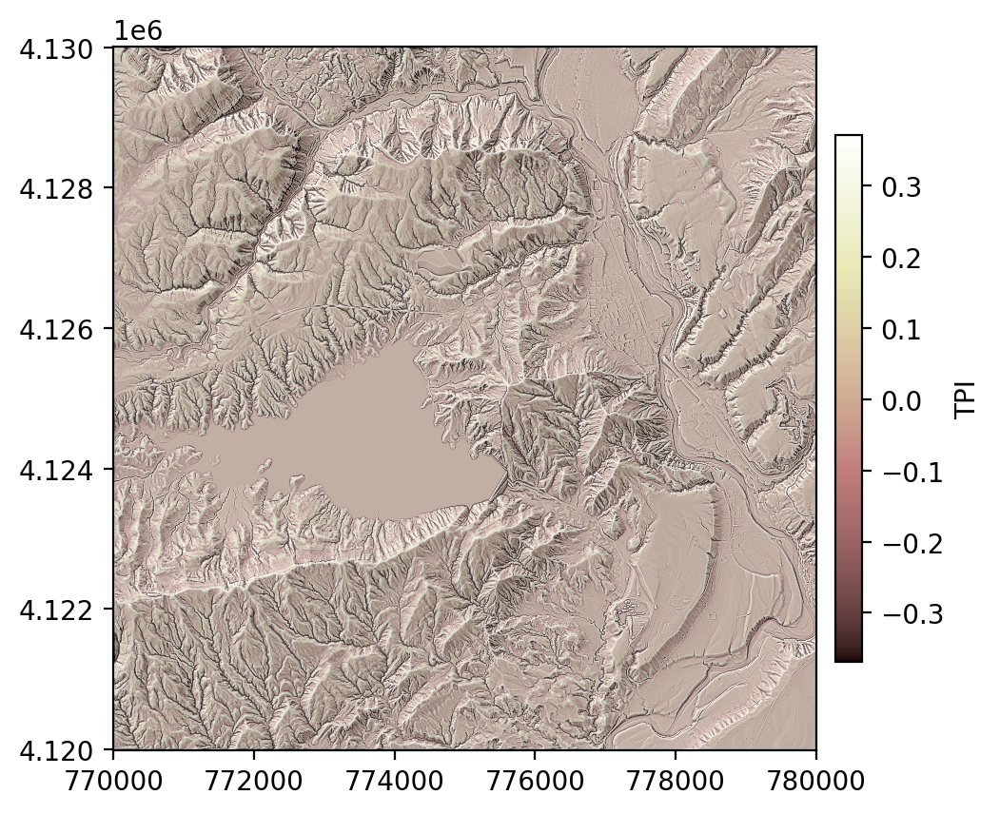

In [7]:
#Here let's look at another popular derivative, the topographic position index, TPI
derivativeToPlot = 'TPI'

#Load in the hillshade to serve as a base
hsSrc = gdal.Open(pathDict['hillshade'])

#Load in a derivative as an overlay
derivSrc = gdal.Open(pathDict[derivativeToPlot])

#First create a figure
f,ax = plt.subplots(1,1,dpi = 200)

#Plot the hillshade first
dd.plot_gdal_source(hsSrc,ax=ax, cmap='gray',vmin = 0, vmax = 255)

#Then plot the derivative, giving it a different colormap,
#a colorbar, scaling its colors to trim extreme values
dd.plot_gdal_source(derivSrc, ax=ax, cmap = 'pink',
                    alpha = 0.5, #0-1 transparency level
                    doTrimToPercentiles = True, #Trim the displayed colors to a percentile range?
                    valueMinMaxPercentiles = [10,90], #Min, max percentiles to stretch colors between
                    doAddColorbar = True, #Should we add an inset colorbar

                    #colorbarKwargs is a dictionary of keyword arguments defined by the matplotlib.pyplot.colorbar function
                    #for controlling the appearance of the colorbar. See matplotlib documentation for all options
                    colorbarKwargs = {
                        'location':'right', #Where to draw the colorbar, 'top','left','bottom','right'
                        'fraction':0.1, #Fraction of the original axes to use for the colorbar
                        'pad':0.02, #Fraction of original axes between colorbar and image axes
                        'shrink':0.75, #Fraction by which to multiply the size of the colorbar
                        'label':derivativeToPlot, #Label to give the colorbar
                    }
                    )


plt.show()

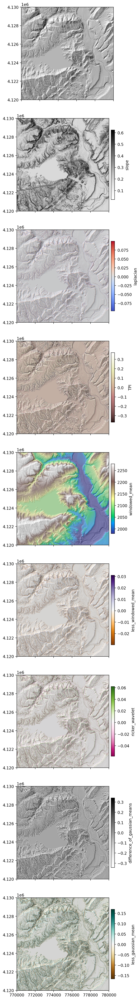

In [8]:
#Or we can look at the suite of derivatives we just calculated

#Lets define some colormaps that might look good for different
#derivatives
colormapDict = {'hillshade':'gray',
                'slope':'Greys',
                'roughness':'cool',
                'windowed_mean':'terrain',
                'less_windowed_mean':'PuOr',
                'gaussian_mean':'terrain',
                'less_gaussian_mean':'BrBG',
                'TPI':'pink',
                'laplacian':'coolwarm',   
                'ricker_wavelet': 'PiYG',
                'difference_of_gaussian_means':'Greys'         
                }

#How big should each figure be?
figsize = (5,5)

#How many derivatives did we calculate?
nDerivs = len(pathDict)

#Set up our figure
f,axs = plt.subplots(nDerivs,1,sharex=True,sharey=True,dpi=200,figsize = (figsize[0],nDerivs*figsize[1]))

#Load in the hillshade to serve as a base
hsSrc = gdal.Open(pathDict['hillshade'])

#Loop through each of the derivatives
for i,derivativeToPlot in enumerate(pathDict):

    if derivativeToPlot in colormapDict:
        cmap = colormap = colormapDict[derivativeToPlot]
    else:
        #If a colormap wasn't specified above, default to gray
        cmap = 'gray'

    #Plot the hillshade first
    dd.plot_gdal_source(hsSrc,ax=axs[i], cmap='gray',vmin = 0, vmax = 255)

    #If this derivative is itself not the hillshade, plot it
    if not(derivativeToPlot == 'hillshade'):
        #Load in a derivative as an overlay
        derivSrc = gdal.Open(pathDict[derivativeToPlot])
        
        #Then plot the derivative, giving it a different colormap,
        #a colorbar, scaling its colors to trim extreme values
        dd.plot_gdal_source(derivSrc, ax=axs[i], cmap = colormap,
                            alpha = 0.5, #0-1 transparency level
                            doTrimToPercentiles = True, #Trim the displayed colors to a percentile range?
                            valueMinMaxPercentiles = [10,90], #Min, max percentiles to stretch colors between
                            doAddColorbar = True, #Should we add an inset colorbar?

                            #colorbarKwargs is a dictionary of keyword arguments defined by the matplotlib.pyplot.colorbar function
                            #for controlling the appearance of the colorbar. See matplotlib documentation for all options
                            colorbarKwargs = {
                                'location':'right', #Where to draw the colorbar, 'top','left','bottom','right'
                                'fraction':0.1, #Fraction of the original axes to use for the colorbar
                                'pad':0.02, #Fraction of original axes between colorbar and image axes
                                'shrink':0.75, #Fraction by which to multiply the size of the colorbar
                                'label':derivativeToPlot, #Label to give the colorbar
                            }
                            )

hsSrc = None
plt.show()

Sometimes we want to chain operations together without saving each intermediate opperation. 

Derivatives calculated with dem_derivatives all require a save path (which can be 'memory' to create a temporary dataset), an input raster (which can be a path to a file on disk or an already in memory dataset), and can optionally return a raster dataset.

We can therefore chain operations by calling dem_derivatives functions directly, requesting to create and return temporary gdal datasources, and then passing those gdal datasources to subsequent functions. 

Below we will first smooth the landscape with a gaussian mean filter, then calculate the absolute value of the laplacian, and finally calculate the mean of that result within a window.

In [9]:
#Showcase the relevant signature of a dem_derivatives function
dd.gaussian_mean??

Signature:
dd.gaussian_mean(
    savePath: str,
    inputRaster,
    sigma: float = 3,
    truncateStds: float = 4,
    doUseConvolve: bool = True,
    doReturnGdalSource: bool = False,
)
Source:   
def gaussian_mean(savePath:str, inputRaster, sigma:float = 3, truncateStds:float = 4,
                   doUseConvolve:bool = True, doReturnGdalSource:bool = False):
    
    """ Calculates a windowed mean weighted by a gaussian distribution with a standard deviation
        (in pixel units) of sigma and a window size that extends radially out to truncateStds*sigma.

    Args:
        savePath (str): The path to save the resulting dataset. Alternatively, may be 'memory'
            to just create a gdal.Dataset in memory.
        inputRaster (str OR gdal.Dataset): The path to the raster of interest or a gdal.Dataset that
            has already been loaded.
        sigma (float): standard deviation of gaussian distribution used to calculates weights for the
            weighted mean kernel.

In [12]:
#First calculate the gaussian mean on the DEM - this smoothes the dem, reducing noise
gaussMeanSrc = dd.gaussian_mean('memory',rasterPath,sigma=1,truncateStds=3,doReturnGdalSource=True)

#Then pass this to the laplacian function
laplSrc = dd.laplacian('memory',gaussMeanSrc,doReturnGdalSource=True)

#Then to the absolute value function
curvSrc = dd.absolute_value('memory',laplSrc,doReturnGdalSource=True)

#Then calculate the mean by passing this to the windowed_mean function, this time saving it
newFileName = os.path.splitext(os.path.split(rasterPath)[-1])[0]+'_smthCrv.tif' #Get just the name of the old file and add a suffix
savePath = os.path.join('..','test_data','test_downloads',newFileName) #Full path to save this file
meanLaplSrc = dd.windowed_mean(savePath,curvSrc,doReturnGdalSource = True)

#Clean up the three intermediary files
gaussMeanSrc = None
laplSrc = None
curvSrc = None

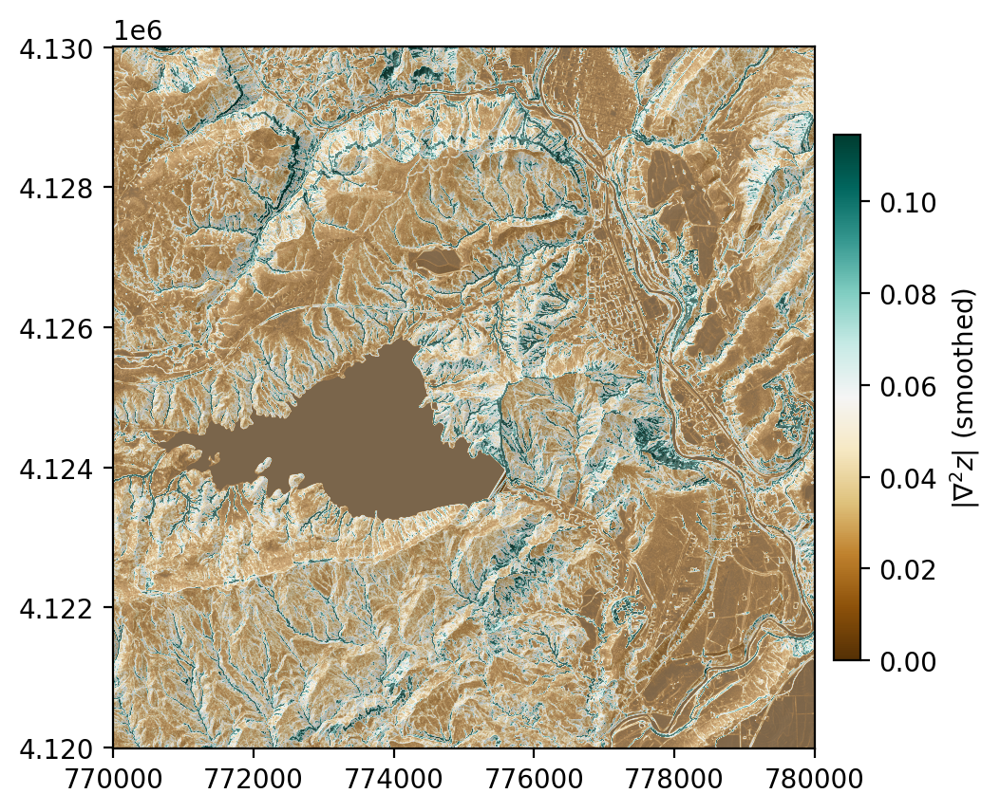

In [13]:
#Load in the hillshade to serve as a base
hsSrc = gdal.Open(pathDict['hillshade'])

#First create a figure
f,ax = plt.subplots(1,1,dpi = 200)

#Plot the hillshade first
dd.plot_gdal_source(hsSrc,ax=ax, cmap='gray',vmin = 0, vmax = 255)

#Then plot the derivative, giving it a different colormap,
#a colorbar, scaling its colors to trim extreme values
dd.plot_gdal_source(meanLaplSrc, ax=ax, cmap = 'BrBG',
                    alpha = 0.6, #0-1 transparency level
                    doTrimToPercentiles = True, #Trim the displayed colors to a percentile range?
                    valueMinMaxPercentiles = [5,95], #Min, max percentiles to stretch colors between
                    doAddColorbar = True, #Should we add an inset colorbar
                    #colorbarKwargs is a dictionary of keyword arguments defined by the matplotlib.pyplot.colorbar function
                    #for controlling the appearance of the colorbar. See matplotlib documentation for all options
                    colorbarKwargs = {
                        'location':'right', #Where to draw the colorbar, 'top','left','bottom','right'
                        'fraction':0.1, #Fraction of the original axes to use for the colorbar
                        'pad':0.02, #Fraction of original axes between colorbar and image axes
                        'shrink':0.75, #Fraction by which to multiply the size of the colorbar
                        'label':r'$|\nabla^2z|$ (smoothed)', #Label to give the colorbar
                    }

                    )

plt.show()

meanLaplSrc = None #Close the dataset